In [275]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import minimize
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

In [276]:
def summary(df):
    summ = pd.DataFrame(df.dtypes,columns = ["Data Type"])
    summ['#total'] = df.shape[0]
    summ["#missing"] = df.isnull().sum().values
    summ["%unique"] = df.nunique().values
    summ["%missing"] = df.isnull().sum().values/len(df)
    summ['%duplicates'] = summ["#total"] - summ["%unique"]
    desc = pd.DataFrame(df.describe(include = "all").transpose())
    summ["min"] = desc["min"].values
    summ["max"] = desc['max'].values
    return summ

## Data Processing

In [277]:
df = pd.read_csv(r"H:\Python Module\Practice\Interesr Rate modelling\Principal Component Analysis\yield-curve-rates-1990-2023.csv.csv")
df["Date"] = pd.to_datetime(df["Date"],dayfirst="True")
df.set_index("Date",inplace = True)
df.sort_values("Date",inplace=True)

# List the variables to keep (<25% missing) and rename
Keep_vars = ['3 Mo','6 Mo','1 Yr','2 Yr','3 Yr','5 Yr','7 Yr','10 Yr','20 Yr']
rename_vars = ['3m','6m','12m','24m','36m','60m','84m','120m','240m']

df = df[Keep_vars]
df.columns = rename_vars

#Drop rows with missing values still (when missing at beginning or end of time series)

df.dropna(inplace=True)



# view the data

summary(df).style.background_gradient(cmap='Blues')


C:\Users\HP\AppData\Local\Temp\ipykernel_13276\3946143068.py:2: UserWarning: Parsing dates in %m/%d/%Y format when dayfirst=True was specified. Pass `dayfirst=False` or specify a format to silence this warning.
  df["Date"] = pd.to_datetime(df["Date"],dayfirst="True")


,Data Type,#total,#missing,%unique,%missing,%duplicates,min,max
3m,float64,7564,0,628,0.000000,6936,0.000000,6.420000
6m,float64,7564,0,636,0.000000,6928,0.020000,6.670000
12m,float64,7564,0,686,0.000000,6878,0.040000,7.320000
24m,float64,7564,0,729,0.000000,6835,0.090000,7.740000
36m,float64,7564,0,747,0.000000,6817,0.100000,7.840000
60m,float64,7564,0,741,0.000000,6823,0.190000,7.900000
84m,float64,7564,0,733,0.000000,6831,0.360000,7.920000
120m,float64,7564,0,725,0.000000,6839,0.520000,8.050000
240m,float64,7564,0,715,0.000000,6849,0.870000,8.300000


In [278]:
df.style.background_gradient(cmap='copper_r')

`style.background_gradient(cmap='Blues')` is used in **pandas** to **visually highlight numerical values in a DataFrame** by applying a **color gradient** as a background.
It is mainly for **data exploration and presentation**, especially in **Jupyter Notebook / JupyterLab**.

---

## 1️⃣ What is `.style` in pandas?

* `.style` returns a **Styler object**
* It allows **HTML/CSS-based formatting**
* Works only for **display**, it **does NOT change the data**

```python
df.style
```

---

## 2️⃣ What does `background_gradient()` do?

```python
df.style.background_gradient(cmap='Blues')
```

✔ Colors cells based on their **relative magnitude**
✔ Smaller values → lighter color
✔ Larger values → darker color

This makes it easy to:

* Spot **high / low values**
* Detect **patterns, outliers, concentrations**

---

## 3️⃣ What is `cmap='Blues'`?

`cmap` stands for **colormap** (from Matplotlib).

### `'Blues'` colormap:

* Light blue → low values
* Dark blue → high values

Other popular colormaps:

```python
'Reds', 'Greens', 'viridis', 'coolwarm', 'plasma', 'inferno'
```

---

## 4️⃣ Simple Example

```python
import pandas as pd
import numpy as np

df = pd.DataFrame({
    'A': [10, 20, 30],
    'B': [5, 15, 25],
    'C': [100, 50, 10]
})

df.style.background_gradient(cmap='Blues')
```

📊 **What you see in Jupyter**:

* Highest values → darkest blue
* Lowest values → lightest blue

---

## 5️⃣ Column-wise vs Whole DataFrame

### 🔹 Default (whole DataFrame)

```python
df.style.background_gradient(cmap='Blues')
```

* Gradient computed using **global min and max**

### 🔹 Column-wise gradient

```python
df.style.background_gradient(cmap='Blues', axis=0)
```

* Each column scaled independently

### 🔹 Row-wise gradient

```python
df.style.background_gradient(cmap='Blues', axis=1)
```

---

## 6️⃣ Apply Gradient to Specific Columns

```python
df.style.background_gradient(
    cmap='Blues',
    subset=['A', 'B']
)
```

Only columns **A and B** will be colored.

---

## 7️⃣ Use with Financial / Risk Data (Very Common)

Example with **PnL / VaR / ES**:

```python
df.style.background_gradient(
    cmap='Reds',
    subset=['PnL']
)
```

* Large losses → darker red
* Makes **risk concentrations visible instantly**

---

## 8️⃣ Important Notes ⚠️

✔ Works **only in Jupyter environments**
❌ Has **no effect in console / scripts**
❌ Cannot be saved directly to Excel (unless using `.to_excel(engine='openpyxl')` with styles)

---

## 9️⃣ When Should You Use It?

✅ Exploratory Data Analysis (EDA)
✅ Risk reports
✅ Performance dashboards
✅ Quick visual comparison

❌ Not for heavy computation
❌ Not for modifying values

---

## 🔑 Summary

| Feature                 | Description                            |
| ----------------------- | -------------------------------------- |
| `.style`                | Formatting layer                       |
| `background_gradient()` | Applies color based on value magnitude |
| `cmap='Blues'`          | Blue color scale                       |
| Output                  | Visual only                            |
| Best used in            | Jupyter Notebook                       |

---

If you want, I can also show:

* How to **export styled DataFrame to Excel**
* Best colormaps for **VaR / ES / PnL**
* Combine with `.format()` or `.bar()`

Just tell me 👍


## Visualising Data


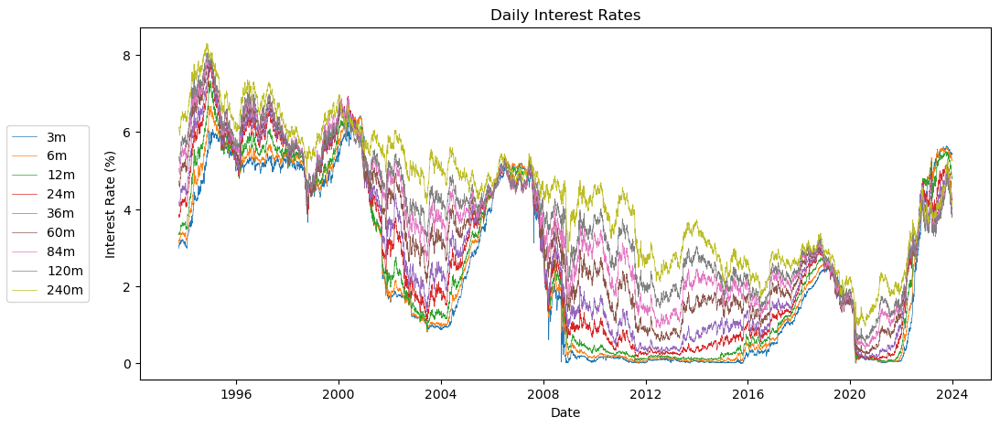

In [279]:
def plot_rates(df):
    plot_vars = df.columns
    
    fig,ax = plt.subplots(figsize=(12,5),ncols= 1,nrows =1)
    for var in plot_vars:
        ax.plot(df.index,df[var],label = var,lw =0.5)
    ax.set(title = "Daily Interest Rates",xlabel = "Date",ylabel = 'Interest Rate (%)')
    fig.legend(loc="center left")
    plt.show()
    
plot_rates(df)
    

### Principle Component Analysis

The purpose of this section is to decompose the yield curve into principle components and then recontruct the original yield curve using a subset of the principle components to assess the accuracy of PCA before extrapolation. The steps required to estimate the dimension reduction error includes:

- Standardising the interest rate time series
- Computing the covariance matrix
- Eigenvalue and eigenvector decomposition
- Selecting principle components
- reconstructing the interest rates from the principle component scores

#### Standardising the Data

Now that the dataset has been loaded, it must be prepared for dimensionality reduction. The majority of machine learning and optimization algorithms perform better when all the features are along the same scale. In order to do this a standardization approach can be implemented. A feature value $x^i$
can be become a standardized feature value  $x_s^i$ by using the following calculation:
    
$x_s^i = \frac{x^i - \mu_x}{\sigma_x}$
  

where $\mu_x$  is the mean of the feature column and $\sigma_x$ is the corresponding sample variance. This results in the feature values having a mean of 0 and a standard deviation of 1, therefore having the same parameters as a normal distribution. As an example, for a feature column with values from 0 to 5 applying standardization would result in the following new values:

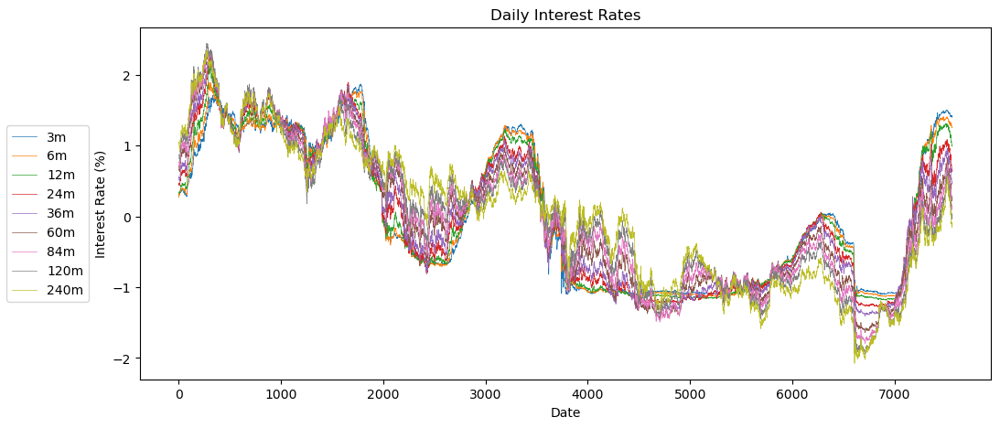

In [280]:
# create instance of scalar

scaler = StandardScaler()
df_scaler = pd.DataFrame(scaler.fit_transform(np.array(df)))
df_scaler.columns = df.columns
plot_rates(df_scaler)

Let’s break this down **line by line**, explain **what happens internally**, and also connect it to **statistics and practical use cases**.

---

## 📌 Code

```python
scaler = StandardScaler()
df_scaler = pd.DataFrame(scaler.fit_transform(np.array(df)))
```

---

## 1️⃣ What is `StandardScaler`?

`StandardScaler` comes from **scikit-learn**:

```python
from sklearn.preprocessing import StandardScaler
```

### 📐 What it does mathematically

For each feature (column):

$[
z = \frac{x - \mu}{\sigma}
]$

Where:

* ( x ) = original value
* $(\mu )$ = column mean
* $(\sigma )$ = column standard deviation

➡ This process is called **standardization** or **Z-score normalization**

---

## 2️⃣ Line-by-Line Explanation

---

### 🔹 Line 1

```python
scaler = StandardScaler()
```

This:

* Creates a **scaler object**
* Does **nothing to data yet**
* Stores methods to:

  * Compute mean & std (`fit`)
  * Transform data (`transform`)
  * Do both at once (`fit_transform`)

📦 Think of it as an **empty measuring instrument**

---

### 🔹 Line 2 (core logic)

```python
df_scaler = pd.DataFrame(scaler.fit_transform(np.array(df)))
```

Let’s split this into parts.

---

## 3️⃣ Step-by-Step Breakdown

### 🔸 Step 1: Convert DataFrame to NumPy array

```python
np.array(df)
```

Why?

* `StandardScaler` expects **numerical arrays**
* Pandas DataFrame is converted into a **2D NumPy array**

Example:

```python
df
#   A   B
#  10  50
#  20  60
```

Becomes:

```python
[[10, 50],
 [20, 60]]
```

⚠ Important:

* **All columns must be numeric**
* Missing values (`NaN`) will cause errors

---

### 🔸 Step 2: `fit_transform()`

```python
scaler.fit_transform(data)
```

This does **two operations** in one line:

---

### 🧠 (a) `fit()`

* Calculates **mean** and **standard deviation** for each column
* Stores them internally

Example:

```python
Mean: [15, 55]
Std:  [5, 5]
```

---

### 🔄 (b) `transform()`

Applies:
$[
z = \frac{x - \mu}{\sigma}
]$

Example:

```python
(10 - 15) / 5 = -1
(20 - 15) / 5 =  1
```

Result:

```python
[[-1, -1],
 [ 1,  1]]
```

---

### 🔸 Step 3: Convert back to DataFrame

```python
pd.DataFrame(...)
```

Why?

* `fit_transform()` returns a **NumPy array**
* Converting back gives:

  * Tabular structure
  * Easier column handling

⚠ But column names and index are lost unless specified!

---

## 4️⃣ Best Practice Version (Recommended)

Your code works, but here’s a **cleaner and safer version**:

```python
df_scaler = pd.DataFrame(
    scaler.fit_transform(df),
    columns=df.columns,
    index=df.index
)
```

✔ Preserves column names
✔ Preserves index
✔ Cleaner and professional

---

## 5️⃣ What Does the Output Look Like?

### Before Scaling

| Feature | Mean | Std |
| ------- | ---- | --- |
| A       | 15   | 5   |
| B       | 55   | 5   |

### After Scaling

| Feature | Mean | Std |
| ------- | ---- | --- |
| A       | 0    | 1   |
| B       | 0    | 1   |

📌 **Each column now has:**

* Mean ≈ 0
* Std ≈ 1

---

## 6️⃣ Why Do We Use StandardScaler?

### 🔥 Very Important in:

* Machine Learning models
* PCA
* K-Means
* SVM
* Neural Networks
* GARCH residual standardization
* Portfolio risk modeling

### ❌ Without scaling:

* Features with large values dominate
* Optimization converges poorly

---

## 7️⃣ Common Mistakes to Avoid

| Mistake                            | Why it's bad        |
| ---------------------------------- | ------------------- |
| Scaling target variable            | Data leakage        |
| Using `fit_transform` on test data | Information leakage |
| Ignoring NaNs                      | Causes errors       |
| Losing column names                | Hard to interpret   |

---

## 8️⃣ Train-Test Proper Usage (Very Important)

```python
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
```

❗ Never `fit()` on test data.

---

## 🧠 Summary

| Component       | Purpose             |
| --------------- | ------------------- |
| StandardScaler  | Standardizes data   |
| fit()           | Learns mean & std   |
| transform()     | Applies scaling     |
| fit_transform() | Fit + Transform     |
| np.array(df)    | Converts to numeric |
| pd.DataFrame()  | Makes data readable |

---

If you want, I can:
✔ Explain difference vs MinMaxScaler
✔ Show example with returns data
✔ Connect this to PCA or VaR modeling

Just tell me 😊


### Compute Covariance Matrix ¶
Covariance measures how two features vary with each other. A positive covariance indicates that features increase and decrease together. Whereas, a negative covariance indicates that the two features vary in the opposite directions. For two feature vectors xⱼ and xₖ the covariance between them σⱼₖ can be calculated using the following equation:

A covariance matrix contains the covariance values between features and has shape d × d. For our dataset, the covariance matrix should, therefore, look like the following:

Since the feature columns have been standardized and therefore they each have a mean of zero, the covariance matrix Σ can be calculated by the following:

where $X^T$ is the transpose of X.

In [281]:
# Compute covariance matrix
X = np.array(df_scaler)
cov = (X.T @ X) / (X.shape[0] - 1)  ## since data s standardised data so w don't need here to - $\mu_x$

cov

array([[1.00013222, 0.99804614, 0.99159797, 0.97226571, 0.95315072,
        0.91165975, 0.87609559, 0.83151385, 0.7696283 ],
       [0.99804614, 1.00013222, 0.99707764, 0.98118017, 0.96352834,
        0.92306936, 0.88735888, 0.84305273, 0.78014913],
       [0.99159797, 0.99707764, 1.00013222, 0.99220566, 0.97898338,
        0.94385442, 0.91058155, 0.8685233 , 0.80701729],
       [0.97226571, 0.98118017, 0.99220566, 1.00013222, 0.99641953,
        0.97440589, 0.94869299, 0.91225152, 0.85674988],
       [0.95315072, 0.96352834, 0.97898338, 0.99641953, 1.00013222,
        0.98951278, 0.97058695, 0.94014026, 0.89094117],
       [0.91165975, 0.92306936, 0.94385442, 0.97440589, 0.98951278,
        1.00013222, 0.99488396, 0.97808282, 0.9431594 ],
       [0.87609559, 0.88735888, 0.91058155, 0.94869299, 0.97058695,
        0.99488396, 1.00013222, 0.99338537, 0.97049436],
       [0.83151385, 0.84305273, 0.8685233 , 0.91225152, 0.94014026,
        0.97808282, 0.99338537, 1.00013222, 0.99016522],


### Eigenvalue and Eigenvector Decomposition ¶
The eigenvectors represent the principal components (the directions of maximum variance) of the covariance matrix. The eigenvalues are their corresponding magnitude. The eigenvector that has the largest corresponding eigenvalue represents the direction of maximum variance. An eigenvector v satisfies the following condition:

Where λ is a scalar and known as the eigenvalue.

### Eigenvectors (the second element) 
- Type and Shape: The second element is a 2-D NumPy array (a matrix) with the same dimensions as the input square matrix.
- Content: The columns of this matrix are the right eigenvectors, often denoted by $(v)$. The eigenvector at eigenvectors**[:, i]** corresponds to the eigenvalue at **eigenvalues[i]** in the first array.
- Normalization: The eigenvectors are normalized, meaning they have a Euclidean norm (unit "length") of 1.
- Uniqueness: For any given matrix, there are infinitely many possible eigenvectors (any non-zero scalar multiple of an eigenvector is also an eigenvector). numpy.linalg.eig() returns a specific, normalized set of these vectors, but the exact vectors chosen may vary slightly between different computations or machines due to numerical stability. 

In [282]:
eig_values, eig_vectors = np.linalg.eig(cov)

print(f"eig_values: {eig_values}")
print("\n",f"eig_vector: {eig_vectors}")

eig_values: [8.45630922e+00 5.03284280e-01 3.44318408e-02 4.22969534e-03
 1.67544434e-03 6.02535687e-04 3.20526724e-04 2.45632294e-04
 9.08264467e-05]

 eig_vector: [[-0.32757976  0.40726287  0.48266969 -0.47211066  0.32206163 -0.34397775
   0.09573013  0.19938114 -0.00290941]
 [-0.3303282   0.38491088  0.26957557  0.05594988 -0.2631346   0.42155429
  -0.12980947 -0.63390075  0.03601423]
 [-0.33490908  0.31692029 -0.00379077  0.42032097 -0.35629686  0.18547549
   0.12855367  0.63831148 -0.15936483]
 [-0.34056151  0.17078502 -0.33796192  0.34655286  0.2048042  -0.37813341
  -0.38783588 -0.05886922  0.53077425]
 [-0.34245296  0.05724153 -0.43482743  0.08775988  0.29808924 -0.15098986
   0.20186252 -0.26791506 -0.67711934]
 [-0.34138033 -0.14109    -0.3413102  -0.31429431 -0.00153055  0.27701424
   0.60419646  0.00627751  0.45436496]
 [-0.33710101 -0.27221624 -0.1626193  -0.4212419   0.04981034  0.36511913
  -0.62516925  0.24590478 -0.14585144]
 [-0.32932635 -0.40282566  0.10985989 -0.113

In [283]:
wer = np.argmax(eig_values)
wer

0

### Selecting Principle Components ¶
Now that the eigenpairs have been computed they now need to be sorted based on the magnitude of their eigenvalues. Now that the principal components have been sorted based on the magnitude of their corresponding eigenvalues, it is time to determine how many principal components to select for dimensionality reduction. This can be done by plotting the cumulative sum of the eigenvalues.

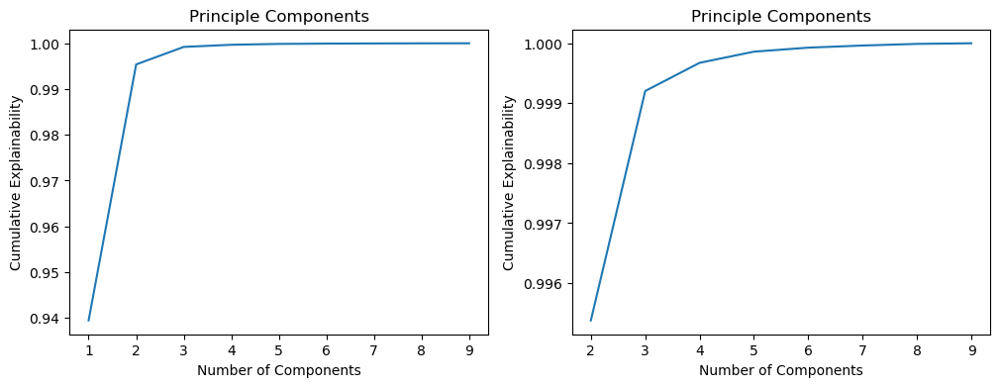

In [284]:
# Sort the eigenvectors
idx = np.argsort(eig_values, axis=0)[::-1]  ## argsort gives result index in ascending order but adding :[::-1] gives result in descending order.
sorted_eig_vectors = eig_vectors[:, idx]

# Cumulative sum of the eigenvalues
cumsum = np.cumsum(eig_values[idx]) / np.sum(eig_values[idx])
xint = range(1, len(cumsum) + 1)

# Plot the explainability by the number of components
fig, ax = plt.subplots(figsize=(12,4), ncols=2, nrows=1)
ax[0].plot(xint, cumsum)
ax[0].set(title='Principle Components', xlabel='Number of Components', ylabel='Cumulative Explainability')

ax[1].plot(xint[1:], cumsum[1:])
ax[1].set(title='Principle Components', xlabel='Number of Components', ylabel='Cumulative Explainability')
plt.show()

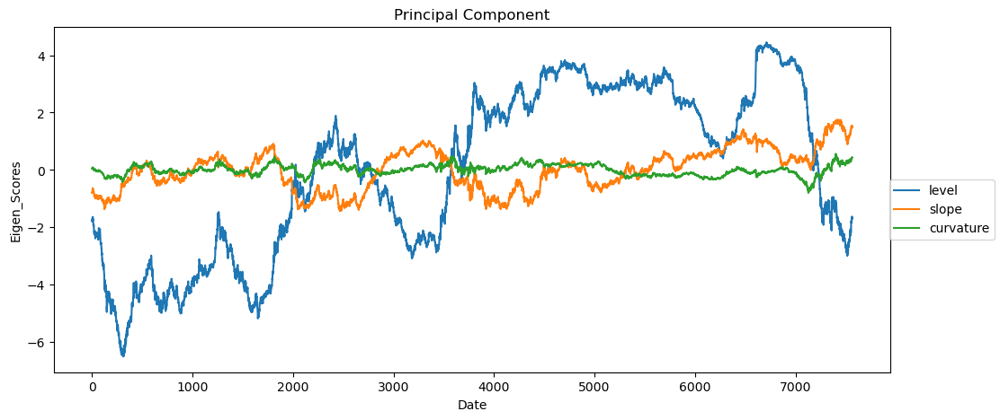

In [285]:
pc_scores=np.dot(X,sorted_eig_vectors[:,:3])

fig, ax = plt.subplots(figsize=(12,5), ncols=1, nrows=1)
for i, pca in enumerate(['level','slope','curvature']):
    ax.plot(pc_scores[:,i],label=pca)
ax.set_title("Principal Component")
ax.set_xlabel("Date")
ax.set_ylabel("Eigen_Scores")
fig.legend(loc='right')
plt.show()
#fig,ax = plt.subplots(figsize=(6,4),ncols =1,nrows=1)
df_pca = pd.DataFrame(pc_scores,columns = ["PC1","PC2","PC3"])
df_pca.index = df.index



In [286]:
df_pca

,PC1,PC2,PC3
Date,,,
1993-10-01,-1.752899,-0.792692,0.046672
1993-10-04,-1.762600,-0.768666,0.060698
1993-10-05,-1.791944,-0.761223,0.071276
1993-10-06,-1.775922,-0.769527,0.074908
1993-10-07,-1.760599,-0.765785,0.077534
...,...,...,...
2023-12-22,-1.743089,1.488358,0.424848
2023-12-26,-1.733269,1.488363,0.422952
2023-12-27,-1.624034,1.549068,0.437562


### Interest Rate Recomposition ¶
To reconstruct the original variables from a principal component (PC), you can map it back to the original space using the transpose of the matrix of eigenvectors $(V^T)$. The reconstruction is obtained by multiplying the PC scores (Z) with the transpose of the eigenvectors matrix $(V^T)$:


$X= ZV^T$
To obtain the final reconstruction $(X_{raw})$you need to add the mean vector $(\mu)$) to the result:

PCA reconstruction=$Z⋅V^T + \mu$  
t's worth noting that directly going from the original space to the reconstructed space can be achieved by multiplying the original data matrix (X) with the product of eigenvectors and their transpose $(VV^T)$. This multiplication is referred to as a projection matrix. If all eigenvectors are used, $(VV^T)$ is the identity matrix, resulting in perfect reconstruction. However, if a subset of eigenvectors is used, it introduces dimensionality reduction.

For any point $(z)$ in the principal component space, you can map it back to the original space using the formula 
$X^=zV^T$ .This process allows for the reconstruction of the original variables from their principal components.


This is an **excellent and very important PCA question** 👍
Let’s go **slow, mathematical, and intuitive**, so the transformation is crystal clear.

---

# 1️⃣ What We Start With

You have the PCA forward transformation:

$[
\boxed{Z = X_{\text{scaled}} \cdot V}
]$

Where:

| Symbol                | Meaning                                          |
| -------------------   | ------------------------------------------------ |
| $(X_{\text{scaled}})$ | Mean-centered / standardized data ((n \times p)) |
| (V)                   | Eigenvector (loading) matrix ((p \times p))      |
| (Z)                   | Principal Component scores ((n \times p))        |

---

# 2️⃣ Key Property That Makes This Possible

### 🔑 Eigenvectors form an **orthonormal basis**

That means:

$[
\boxed{V^\top V = V V^\top = I}
]$

This property is **critical**.

> Orthonormal ⇒ inverse of (V) equals transpose of (V)

$[
\boxed{V^{-1} = V^\top}
]$

---

# 3️⃣ Algebraic Derivation (Step-by-Step)

Starting from:

$[
Z = X_{\text{scaled}} \cdot V
]$

### Step 1: Multiply both sides by (V^\top)

$[
Z \cdot V^\top = X_{\text{scaled}} \cdot V \cdot V^\top
]$

---

### Step 2: Use orthonormality

$[
V \cdot V^\top = I
]$

So:

$[
Z \cdot V^\top = X_{\text{scaled}} \cdot I
]$

---

### Step 3: Identity matrix disappears

$[
\boxed{X_{\text{scaled}} = Z \cdot V^\top}
]$

✅ **Recovered exactly**

---

# 4️⃣ Why This Works Intuitively (Very Important)

### Think in terms of geometry

* PCA **rotates** the coordinate system
* (V) = rotation matrix
* $(V^\top)$ = reverse rotation

| Operation        | Meaning                       |
| ---------------- | ----------------------------- |
| $(X \cdot V)$      | Rotate data into PC space     |
| $(Z \cdot V^\top)$ | Rotate back to original space |

So PCA is:

> Rotate → analyze → rotate back

---

# 5️⃣ Why Transpose = Inverse?

### Example with 2D rotation

A rotation matrix:

$[
V = \begin{bmatrix}
\cos\theta & -\sin\theta \
\sin\theta & \cos\theta
\end{bmatrix}
]$

Its transpose:

$[
V^\top = \begin{bmatrix}
\cos\theta & \sin\theta \
-\sin\theta & \cos\theta
\end{bmatrix}
]$

This **undoes the rotation**.

---

# 6️⃣ Important Case: Using Only k Components

If you keep only (k < p) PCs:

$[
Z_k = X_{\text{scaled}} \cdot V_k
]$

Then:

$[
\boxed{
\hat{X}_{\text{scaled}} = Z_k \cdot V_k^\top
}
]$

This is:

* **Best rank-k approximation**
* **Least-squares optimal**

But **not exact** anymore.

---

# 7️⃣ Matrix Dimensions (Common Confusion)

| Term                  | Shape          |
| -------------------   | ------------   |
| $(X_{\text{scaled}})$ | $(n \times p)$ |
| (V)                   | $(p \times p) $|
| (Z)                   | $(n \times p)$ |
| $(V^\top)$            | $(p \times p)$ |

Multiplication is valid both ways.

---

# 8️⃣ Why This Would NOT Work Otherwise

If (V) were **not orthonormal**, then:

$[
V^{-1} \neq V^\top
]$

You would need:

$[
X_{\text{scaled}} = Z \cdot V^{-1}
]$

PCA avoids this by construction.

---

# 9️⃣ Finance Intuition (Your Context)

In **yield curve PCA**:

* (V) = level, slope, curvature factors
* (Z) = factor time series
* $(Z \cdot V^\top)$ = reconstruct full yield curve

This is why **3 factors** can rebuild the curve.

---

# 🔟 Final One-Line Takeaway

$[
\boxed{
Z = X_{\text{scaled}} V ;\Rightarrow;
X_{\text{scaled}} = Z V^\top
}
]$

✔ Because **eigenvectors are orthonormal**
✔ Because **transpose = inverse**
✔ Because PCA is a **rotation**

---


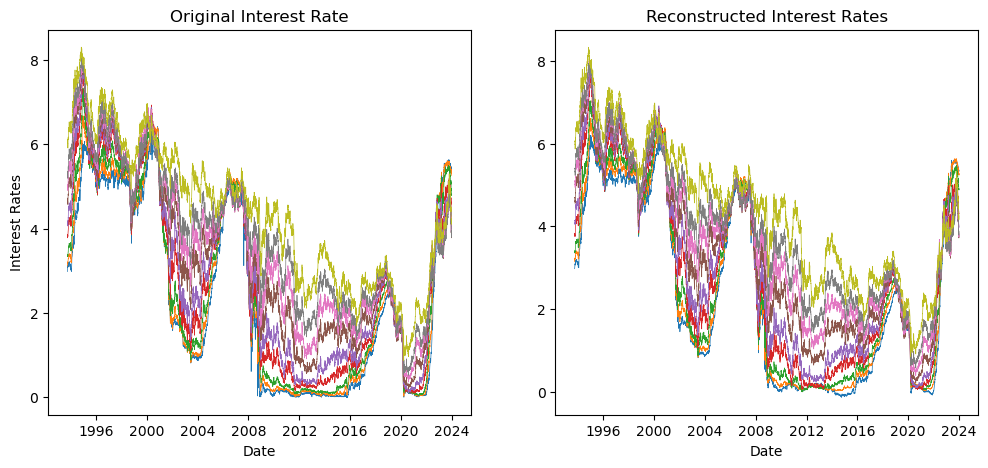

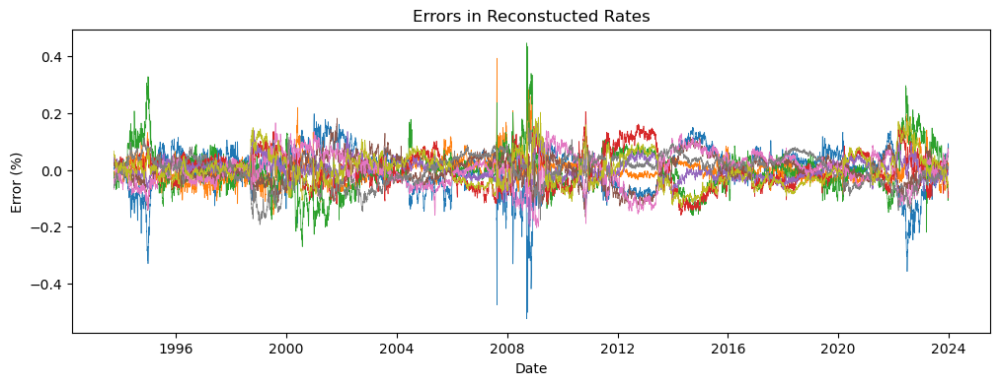

In [287]:
reconstrucred_scaler_rates = np.dot(pc_scores,sorted_eig_vectors[:,:3].T)

reconstructed_rates = scaler.inverse_transform(reconstrucred_scaler_rates)

plot_vars = df.columns

## Plot befor and after PCA

fig,ax = plt.subplots(figsize = (12,5),ncols=2,nrows =1)
plt.subtitle =("Comparison of all rates")
ax[0].plot(df.index,df[plot_vars],lw = 0.5)
ax[0].set(title = "Original Interest Rate",xlabel = "Date",ylabel = "Interest Rates")
ax[1].plot(df.index,reconstructed_rates,lw =0.5)
ax[1].set(title='Reconstructed Interest Rates', xlabel='Date')
plt.show()

# calculating errors

errors = np.array(df[plot_vars]) - reconstructed_rates

fig, ax = plt.subplots(figsize=(12,4), ncols=1, nrows=1)

ax.plot(df.index,errors,lw =0.5)
ax.set(title='Errors in Reconstucted Rates', xlabel='Date', ylabel='Error (%)')
plt.show()

Let’s break this **line-by-line, mathematically and intuitively**, because this line is **crucial in PCA / ML workflows**, especially in finance.


---

# 3️⃣ Why `inverse_transform` Is Needed

After PCA reconstruction, your data is still in **scaled space**:

$[
\hat{x}_{\text{scaled}} = \frac{\hat{x} - \mu}{\sigma}
]$

You want to go **back to original units**:

$[
\boxed{
\hat{x} = \hat{x}_{\text{scaled}} \cdot \sigma + \mu
}
]$

That is exactly what `inverse_transform()` does.

---

# 4️⃣ What `inverse_transform()` Does Internally

For each column:

```python
original_value = scaled_value * scaler.scale_ + scaler.mean_
```

So:

| Attribute       | Meaning                     |
| --------------- | --------------------------- |
| `scaler.mean_`  | Feature means               |
| `scaler.scale_` | Feature standard deviations |

---

# 5️⃣ Step-by-Step Flow (Very Important)

### Full pipeline:

```text
Original Rates
     ↓
StandardScaler.fit_transform
     ↓
Scaled Rates (X_scaled)
     ↓
PCA Projection
     ↓
PC Scores (Z)
     ↓
PCA Reconstruction
     ↓
Reconstructed Scaled Rates
     ↓
inverse_transform
     ↓
Reconstructed Original Rates
```

---

# 6️⃣ Financial Intuition (Yield Curve Example)

Suppose:

* Data = yields (2Y, 5Y, 10Y)
* PCA captures level, slope, curvature
* You reconstruct using 3 PCs

Then:

* `reconstructed_scaled_rates` → **dimensionless**
* `reconstructed_rates` → **actual yield values (%)**

✔ This allows:

* Plotting yield curves
* Comparing original vs reconstructed
* Computing errors (RMSE)

---

# 7️⃣ What Happens If You Skip This Step?

If you **don’t** do `inverse_transform`:

❌ Values will:

* Have mean ≈ 0
* Std ≈ 1
* Be meaningless financially

Example:

```python
# WRONG comparison
original_rates - reconstructed_scaled_rates
```

You must compare **like with like**.

---

# 8️⃣ Common Mistakes

### ❌ Using a different scaler

```python
StandardScaler().inverse_transform(...)
```

✔ Must use **same scaler object**

---

### ❌ Re-fitting the scaler

```python
scaler.fit(reconstructed_scaled_rates)  # WRONG
```

✔ This destroys original scale

---

# 9️⃣ Mathematical Summary

$[
\begin{aligned}
X_{\text{scaled}} &= \frac{X - \mu}{\sigma} \
\hat{X}*{\text{scaled}} &= Z V^\top \
\hat{X} &= \hat{X}*{\text{scaled}} \sigma + \mu
\end{aligned}
]$

---

# 🔟 One-Line Takeaway

```python
reconstructed_rates = scaler.inverse_transform(reconstructed_scaled_rates)
```

> **Converts PCA-reconstructed standardized data back into real-world units using the original mean and variance.**

---




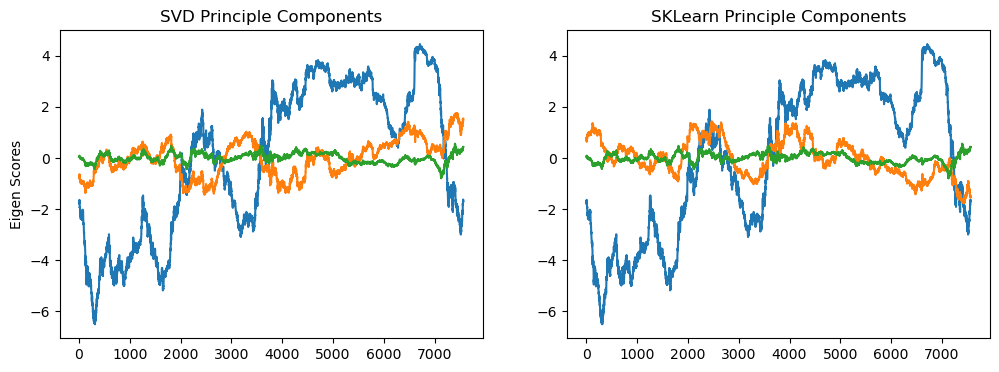

In [288]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pc_scores_sklearn = pca.fit_transform(df_scaler) * -1 #The -1 is used only to flip PCA sign for better interpretability; PCA itself is sign-invariant.

fig, ax = plt.subplots(figsize=(12,4), ncols=2, nrows=1)

for i, pca in enumerate(['level','slope','curvature']):
    ax[0].plot(pc_scores[:,i], label=pca)
    ax[1].plot(pc_scores_sklearn[:,i], label=pca)

    
ax[0].set(title='SVD Principle Components', ylabel='Eigen Scores')
ax[1].set(title='SKLearn Principle Components')
plt.show()


## Simulation

## Overview¶

In the upcoming section, we will delve into the application of the Vasicek short-rate model as a forecasting tool for each of the principal components over the next 12 months. This involves leveraging a stochastic model that incorporates mean reversion to simulate interest rate dynamics. The calibration process, facilitated by Maximum Likelihood Estimation (MLE), allows us to determine key parameters such as mean reversion strength (κ), long-run mean (θ), and volatility (σ). Subsequently, Monte Carlo simulations based on the Vasicek model will be employed to project interest rate paths, providing valuable insights into the expected behavior of the principal components over the specified timeframe.

Vasicek Model¶
The Vasicek model, named after economist Oldřich Vašíček, is a stochastic model widely employed in finance to describe the evolution of interest rates over time. Introduced in 1977, the model assumes that interest rates exhibit mean reversion, meaning they tend to move towards a long-term average or equilibrium level.

$dr(t)$ = $K(\theta - r_t)\Delta{t}+ \sigma{dwt}$                                                     (1)
 
where:

- r(t) is the short-term interest rate at time
- κ is the mean reversion strength
- θ is the long-run mean or the equilibrium interest rate
- σ is the volatility
- dW(t) is a Wiener process (Brownian motion)



In [289]:
df_pca

,PC1,PC2,PC3
Date,,,
1993-10-01,-1.752899,-0.792692,0.046672
1993-10-04,-1.762600,-0.768666,0.060698
1993-10-05,-1.791944,-0.761223,0.071276
1993-10-06,-1.775922,-0.769527,0.074908
1993-10-07,-1.760599,-0.765785,0.077534
...,...,...,...
2023-12-22,-1.743089,1.488358,0.424848
2023-12-26,-1.733269,1.488363,0.422952
2023-12-27,-1.624034,1.549068,0.437562


In [299]:
def VasicekCallibration(rates,dt = 1/252):
    #rates = rates.iloc[:,0:3]
    #rates["Leg_1"] = rates["1-Month Libor"].shift(1)
    #rates.dropna(inplace=True)
    #rates.drop(columns=["S.No"],inplace=True)
    #rates.set_index("Date")
    rows =[]
    rates_ = rates.copy()
    for i in rates.columns:
        y = rates_[i].iloc[1:]
        x = rates_[i].shift(1).iloc[1:]
        X = sm.add_constant(x)
    ## OLS estimator
        OLS = np.linalg.inv(X.T@X)@X.T@y
    
        rates_["modeled"] = OLS[0] + OLS[1]*x
        rates_["residual"] = y- rates_["modeled"]
        kappa = -np.log(OLS[1])/dt
        theta = OLS[0]/(1-OLS[1])
    ## caculating Variance
        RSS = (rates_["residual"]**2).sum()
        MSE = RSS/(len(rates_["residual"])-2)
        sigma_e = np.sqrt(MSE)
        sigma = sigma_e/np.sqrt(dt)
    
        #r0 = rates_.iloc[len(rates["residual"])-1,1]
        rows.append([i,kappa,theta,sigma])
    
    
    return rows

df_param = pd.DataFrame(VasicekCallibration(df_pca,dt=1/252),columns =["Series","kappa","theta","sigma"]).set_index("Series")
df_param

,kappa,theta,sigma
Series,,,
PC1,0.075916,0.028318,1.129745
PC2,0.282166,0.267932,0.579056
PC3,1.459353,0.008797,0.325644


In [309]:
def vasicekNextrate(r,kappa,theta,sigma,dt=1/252):
    result =   r*np.exp(-kappa*dt) + theta*(1-np.exp(-kappa*dt)) + sigma*np.random.normal()
    return result

def vasiceksimulation(N,r0,kappa,theta,sigma,dt=1/252):
    short_r = [0]*N
    short_r[0] = r0
    for i in range(1,N):
        short_r[i] = vasicekNextrate(short_r[i-1],kappa,theta,sigma,dt=1/12)
    
    return short_r

def vasicekMultiSimu(M,N,r0,kappa,theta,sigma,dt=1/252):
    short_r = np.ndarray((N,M))
    for i in range(0,M):
        short_r[:,i] = vasiceksimulation(N,r0,kappa,theta,sigma,dt=1/252)
    return short_r

In [317]:
years = 1
N = years * 252
t = np.arange(0,N)/252
r0 = 0.001
M = 100

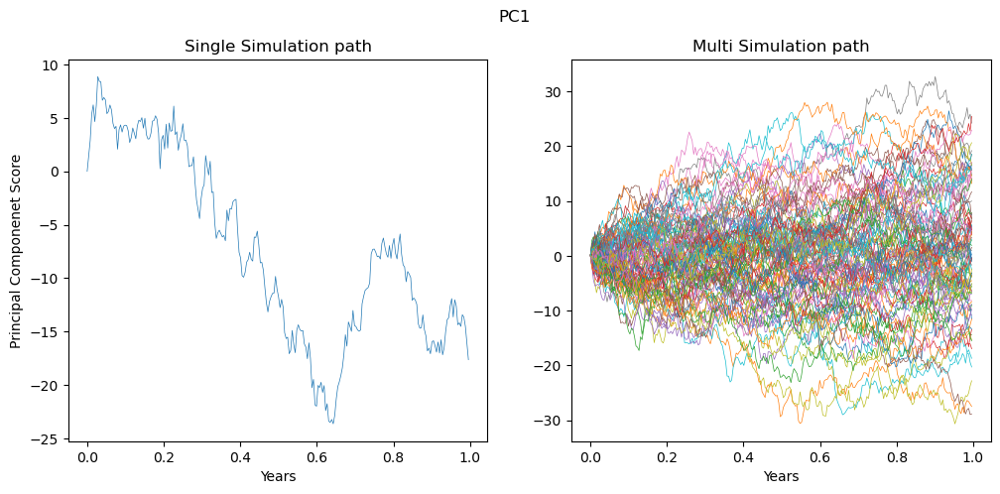

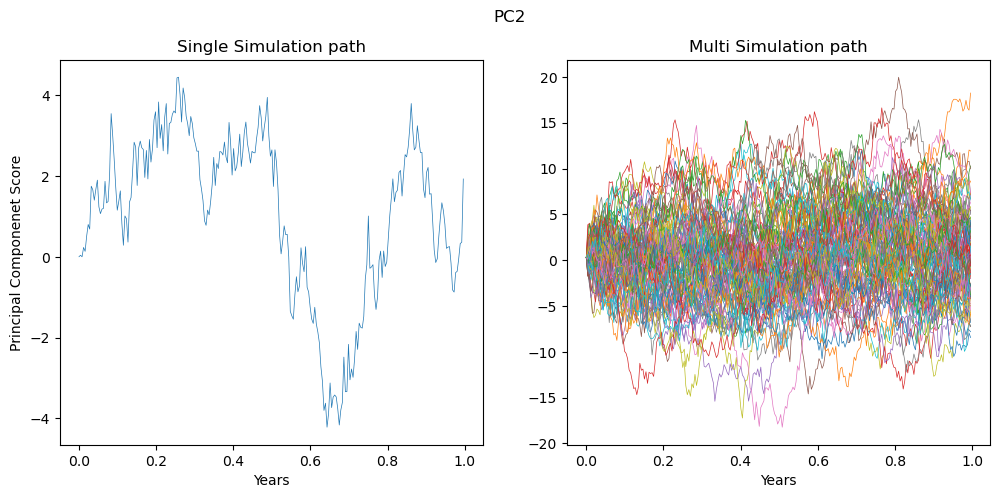

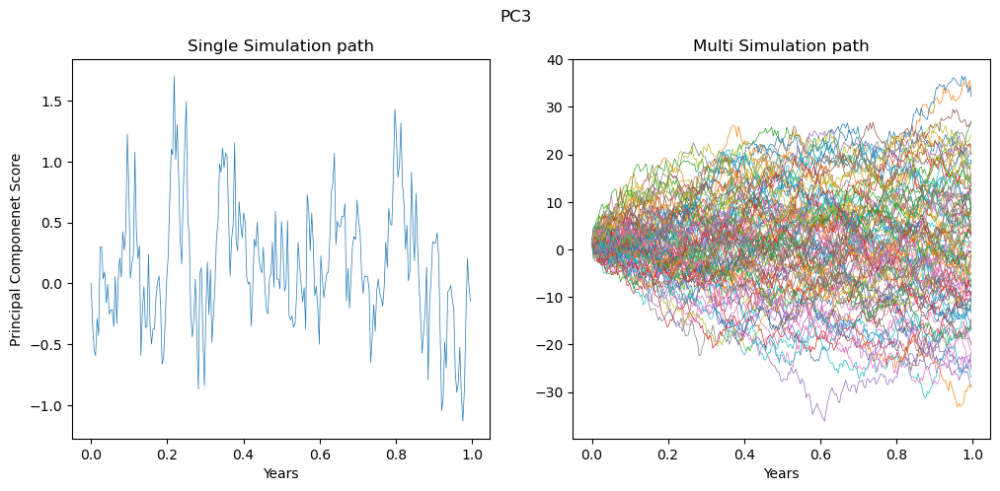

In [320]:
checking=[]
for pc in ["PC1","PC2","PC3"]:
    test_sim = vasiceksimulation(N,r0,df_param.loc[pc,"kappa"],df_param.loc[pc,"theta"],df_param.loc[pc,"sigma"],1)
    rates_arr = vasicekMultiSimu(M,N,df_param.loc[pc,"kappa"],df_param.loc[pc,"theta"],df_param.loc[pc,"sigma"],1)
    
    fig,ax = plt.subplots(figsize = (12,5),ncols = 2,nrows =1)
    plt.suptitle(pc)
    ax[0].plot(t,test_sim,lw = 0.5)
    ax[0].set(title = "Single Simulation path",xlabel="Years",ylabel = "Principal Componenet Score")
    
    ax[1].plot(t,rates_arr,lw = 0.5)
    ax[1].set(title = "Multi Simulation path",xlabel="Years")
    plt.show()

### Reconstruct Simulated Interest Rate
The final step in this process is to simulate each of the principle components and reconstruct the interest rates to get the projections for each of the interest rate paths.

In [328]:
sim_pc1_arr = vasicekMultiSimu(M, N, r0, 
                              df_param.loc['PC1', 'kappa'], 
                              df_param.loc['PC1', 'theta'], 
                              df_param.loc['PC1', 'sigma'])

sim_pc2_arr = vasicekMultiSimu(M, N, r0, 
                              df_param.loc['PC2', 'kappa'], 
                              df_param.loc['PC2', 'theta'], 
                              df_param.loc['PC2', 'sigma'])

sim_pc3_arr = vasicekMultiSimu(M, N, r0, 
                              df_param.loc['PC3', 'kappa'], 
                              df_param.loc['PC3', 'theta'], 
                              df_param.loc['PC3', 'sigma'])

sim_stack_arr = np.stack((sim_pc1_arr, sim_pc2_arr, sim_pc3_arr), axis=1)
print("Shape of PC simulation array:\t", sim_stack_arr.shape)

Shape of PC simulation array:	 (252, 3, 100)


Shape of Interest Rate simulation array:	 (252, 9, 100)


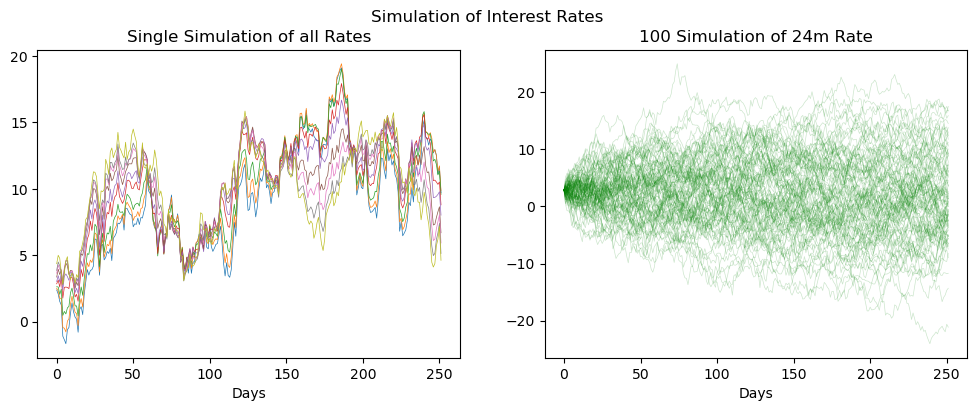

In [333]:
# Reconstruct the interest rates from the simulated principle components
for i in range(M):
    reconstructed_scaled_rates = np.dot(sim_stack_arr[:,:,i], sorted_eig_vectors[:, :3].T)
    reconstructed_rates = scaler.inverse_transform(reconstructed_scaled_rates)

    if i == 0:
        rates_sims = reconstructed_rates 
    else:
        rates_sims = np.dstack((rates_sims, reconstructed_rates))

print("Shape of Interest Rate simulation array:\t", rates_sims.shape)

# Plotting the simulated interest rates
plot_vars = df.columns
fig, ax = plt.subplots(figsize=(12,4), ncols=2, nrows=1)
plt.suptitle('Simulation of Interest Rates')

ax[0].plot(reconstructed_rates, lw=0.5)
ax[0].set(title='Single Simulation of all Rates', xlabel='Days')

ax[1].plot(rates_sims[:,3,:], color="green", alpha=0.2, lw=0.5)
ax[1].set(title='100 Simulation of {} Rate'.format(plot_vars[3]), xlabel='Days')
plt.show()


## Conclusions¶
Hope you found this notebook useful to simulating the interest rate yield curve through principle components. The next steps which I plan to build into this notebook include:

Plotting the 100 simulated yield curves
Determining the confidence intervals for how much the yield curve can change over the next 12m
Experiment with different calibration windows to to assess how this affects the simulation paths in the future